In [1]:
import os
import pandas as pd
import numpy as np
import pickle
import warnings
from sklearn.manifold import TSNE
# from cuml.manifold import TSNE
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

warnings.filterwarnings('ignore')

In [2]:
with open("BERT_embeds.pkl", "rb") as file_to_read:
    corpus_embeds = pickle.load(file_to_read)

In [4]:
# with open("BERT_embeds_critical.pkl", "rb") as file_to_read:
#     corpus_embeds_critical = pickle.load(file_to_read)

In [5]:
with open("embedded_file_names.pkl", "rb") as file_to_read:
    embedded_file_names = pickle.load(file_to_read)

In [6]:
with open("text_topic_mapping.pkl", "rb") as file_to_read:
    text_topic_mapping = pickle.load(file_to_read)

In [7]:
corpus_embeds_np = np.asarray(corpus_embeds)

In [20]:
corpus_embeds_np.shape

(61200, 768)

In [22]:
np.savetxt("corpus_embeds_np.csv", corpus_embeds_np, delimiter=",")

In [23]:
pd.DataFrame(corpus_embeds_np).to_csv("corpus_embeds_np2.csv")

In [10]:
# corpus_embeds_critical_np = np.asarray(corpus_embeds_critical)

In [11]:
# corpus_embeds_critical_np.shape

In [12]:
# corpus_embeds_full = np.concatenate((corpus_embeds_np, corpus_embeds_critical_np))
# corpus_embeds_full.shape

In [7]:
def compute_2d(embeddings, metric='cosine', learning_rate=200):
    model = TSNE(learning_rate=learning_rate, metric=metric)
    return model.fit_transform(embeddings)

In [10]:
embeddings_2d = compute_2d(corpus_embeds, 'cosine', 50)

In [17]:
colors=[]
for file_name in embedded_file_names:
    topic = int(text_topic_mapping[text_topic_mapping['file_name'] == file_name]['topic'])
    colors.append(topic)

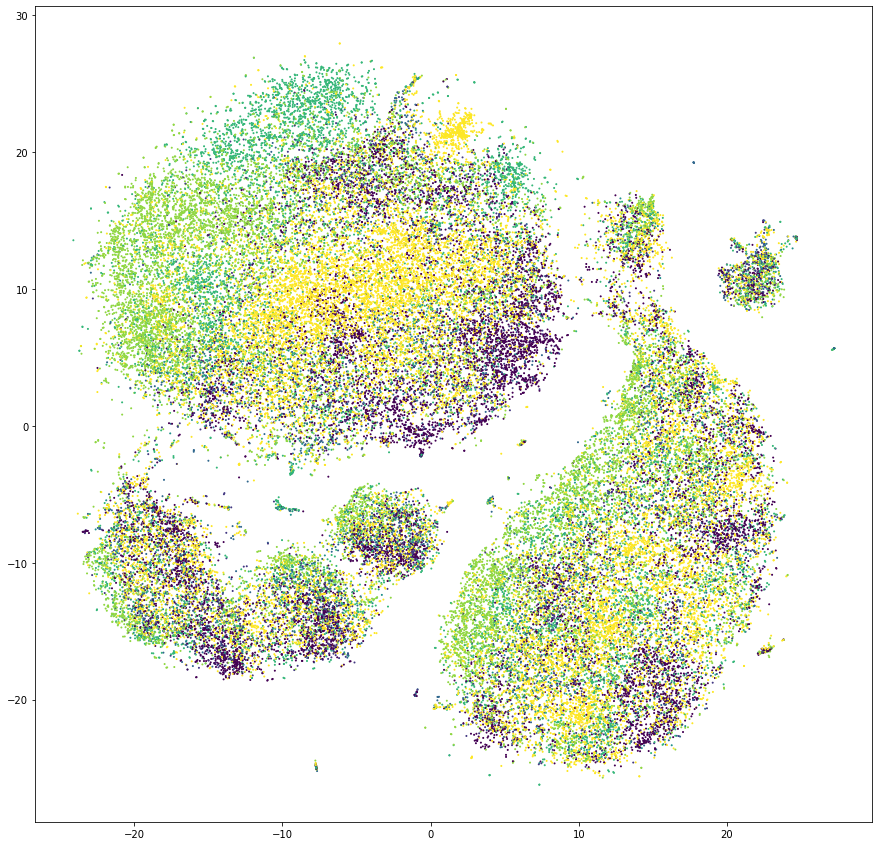

In [41]:
plt.figure(figsize=(15,15))
x, y = embeddings_2d[:, 0], embeddings_2d[:, 1]
# x1, y1 = embeddings_2d[75200:, 0], embeddings_2d[75200:, 1]
plt.scatter(x, y, 1, c=colors)
# plt.scatter(x1, y1, 40)
plt.show()

In [13]:
def compute_3d(embeddings, metric='cosine',learning_rate=200):
    model = TSNE(n_components=3, metric=metric, learning_rate=learning_rate, square_distances=True, init='pca')
    return model.fit_transform(embeddings)

In [14]:
embeddings_3d = compute_3d(corpus_embeds, learning_rate=100)

In [15]:
x, y, z = embeddings_3d[:, 0], embeddings_3d[:, 1], embeddings_3d[:, 2]
# x1, y1, z1 = embeddings_3d[75200:, 0], embeddings_3d[75200:, 1], embeddings_3d[75200:, 2]

In [19]:
fig = go.Figure(data=[go.Scatter3d(x=x, y=y, z=z,
                                   mode='markers', 
                                   marker=dict(
                                        size=1,
                                        color=colors,                # set color to an array/list of desired values
#                                         colorscale='Viridis',   # choose a colorscale
                                        opacity=0.8
                                    )
                                  )
                     ], 
                layout={'height':1000, 'width':1000}
               )
fig.show()

In [40]:
fig = go.Figure(data=[go.Scatter3d(x=x, y=y, z=z,
                                   mode='markers', 
                                   marker=dict(
                                        size=1,
                                        color='blue',                # set color to an array/list of desired values
                                        colorscale='Viridis',   # choose a colorscale
                                        opacity=0.8
                                    )
                                  ),
                      go.Scatter3d(x=x1, y=y1, z=z1,
                                   mode='markers', 
                                   marker=dict(
                                        size=3,
                                        color='red',                # set color to an array/list of desired values
                                        colorscale='Viridis',   # choose a colorscale
                                        opacity=0.8
                                    )
                                  )
                     ], 
                layout={'height':1000, 'width':1000}
               )
fig.show()

NameError: name 'z1' is not defined

In [64]:
with open("BERT_embeds.pkl", "rb") as file_to_read:
    corpus_embeds = pickle.load(file_to_read)

In [ ]:
embeddings_3d = compute_3d(corpus_embeds, learning_rate=50)

In [69]:
x, y, z = embeddings_3d[:, 0], embeddings_3d[:, 1], embeddings_3d[:, 2]


In [70]:
fig = go.Figure(data=[go.Scatter3d(x=x, y=y, z=z,
                                   mode='markers', 
                                   marker=dict(
                                        size=1,
                                        color='blue',                # set color to an array/list of desired values
                                        colorscale='Viridis',   # choose a colorscale
                                        opacity=0.8
                                    )
                                  )
                      
                     ], 
                layout={'height':1000, 'width':1000}
               )
fig.show()